In [1]:
import pandas as pd
import os
import time
from datetime import date
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as pyo
import plotly.express as px
import plotly.graph_objs as go
import scipy.stats as stats
from scipy.stats import norm
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import warnings
warnings.filterwarnings('ignore')
pyo.init_notebook_mode()
pyo.offline.init_notebook_mode(connected=True)

In [2]:
CB91_Blue = '#223FA8'
CB91_Purple = '#8144E6'
CB91_Aqua = '#30E5C5'
CB91_Pink = '#EFA1B5'
CB91_Black = '#2C2731'

color_list = [CB91_Blue, CB91_Purple, CB91_Aqua, CB91_Pink, CB91_Black]
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=color_list)


sns.set_context("notebook", rc={"font.size":16,
                                "axes.titlesize":20,
                                "axes.labelsize":18})

In [3]:
fifa = pd.read_csv('/Users/javiercorderopariente/dataexercises/FIFA/fifa21_male2.csv')

In [4]:
fifa.head(5)

,ID,Name,Age,OVA,Nationality,Club,BOV,BP,Position,Player Photo,...,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,GK,Gender
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,https://cdn.sofifa.com/players/000/002/16_120.png,...,70+-1,70+-1,71+-2,70+-1,69+0,69+0,69+0,70+-1,17+0,Male
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,https://cdn.sofifa.com/players/000/016/19_120.png,...,66+1,66+1,62+1,60+1,60+1,60+1,60+1,60+1,17+1,Male
2,27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,https://cdn.sofifa.com/players/000/027/16_120.png,...,54+0,54+0,52+0,47+0,46+0,46+0,46+0,47+0,15+0,Male
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,https://cdn.sofifa.com/players/000/036/09_120.png,...,65+0,65+0,56+0,57+0,51+0,51+0,51+0,57+0,22+0,Male
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,https://cdn.sofifa.com/players/000/041/20_120.png,...,73+3,73+3,70+3,67+3,64+3,64+3,64+3,67+3,17+3,Male


In [5]:
shape = fifa.shape
shape

(17125, 107)

In [6]:
fcolumns = fifa.columns
fcolumns

Index(['ID', 'Name', 'Age', 'OVA', 'Nationality', 'Club', 'BOV', 'BP',
       'Position', 'Player Photo',
       ...
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'GK', 'Gender'],
      dtype='object', length=107)

In [7]:
fifa.dtypes

ID              int64
Name           object
Age             int64
OVA             int64
Nationality    object
                ...  
CB             object
RCB            object
RB             object
GK             object
Gender         object
Length: 107, dtype: object

In [8]:
fifa.isna().values.any()
#fifa.isna().sum()

True

In [9]:
fifa['Joined'] = pd.to_datetime(fifa['Joined'])
fifa['Joined']

0       2008-07-01
1       2014-07-19
2       2016-01-07
3              NaT
4       2018-07-16
           ...    
17120   2020-09-29
17121   2020-08-20
17122   2020-08-20
17123   2020-09-30
17124   2020-09-30
Name: Joined, Length: 17125, dtype: datetime64[ns]

In [10]:
fifa.describe()

,ID,Age,OVA,BOV,POT,Growth,Attacking,Crossing,Finishing,Heading Accuracy,...,GK Positioning,GK Reflexes,Total Stats,Base Stats,PAC,SHO,PAS,DRI,DEF,PHY
count,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,...,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000,17125.000000
mean,219388.716204,25.272934,66.965022,67.900204,72.489810,5.524788,258.537752,51.621314,47.956672,53.598832,...,15.514277,15.738628,1631.256175,361.372146,68.091620,54.967299,58.926540,64.209869,50.266102,64.910715
std,37499.197507,4.942665,6.864329,6.637538,5.769949,5.787539,72.255687,17.875715,19.391547,16.947164,...,16.406064,17.130908,260.357024,40.252290,11.147116,13.877605,10.186728,9.832734,16.853801,9.660260
min,2.000000,16.000000,38.000000,42.000000,47.000000,-1.000000,33.000000,6.000000,3.000000,5.000000,...,1.000000,1.000000,731.000000,228.000000,25.000000,16.000000,25.000000,28.000000,12.000000,27.000000
25%,204082.000000,21.000000,62.000000,64.000000,69.000000,0.000000,232.000000,41.000000,33.000000,46.000000,...,8.000000,8.000000,1492.000000,333.000000,62.000000,46.000000,52.000000,59.000000,35.000000,59.000000
50%,228961.000000,25.000000,67.000000,68.000000,72.000000,4.000000,271.000000,56.000000,52.000000,57.000000,...,11.000000,11.000000,1659.000000,362.000000,69.000000,58.000000,60.000000,65.000000,53.000000,66.000000
75%,243911.000000,29.000000,72.000000,72.000000,76.000000,9.000000,306.000000,65.000000,64.000000,65.000000,...,14.000000,14.000000,1812.000000,390.000000,75.000000,65.000000,66.000000,71.000000,64.000000,72.000000
max,259105.000000,53.000000,93.000000,93.000000,95.000000,26.000000,437.000000,94.000000,95.000000,93.000000,...,93.000000,90.000000,2316.000000,498.000000,96.000000,93.000000,93.000000,95.000000,91.000000,93.000000


In [11]:
# Selecting the columns I want
fifa1 = fifa[['ID','Name','Age','OVA','Nationality','Height','Weight','foot','Value','Wage']]
fifa1.describe()
fifa1.dtypes

ID              int64
Name           object
Age             int64
OVA             int64
Nationality    object
Height         object
Weight         object
foot           object
Value          object
Wage           object
dtype: object

In [12]:
fifa1.isna().sum()

ID             0
Name           0
Age            0
OVA            0
Nationality    0
Height         0
Weight         0
foot           0
Value          0
Wage           0
dtype: int64

In [13]:
fifa1.head(12)

,ID,Name,Age,OVA,Nationality,Height,Weight,foot,Value,Wage
0,2,G. Pasquale,33,69,Italy,"6'0""",181lbs,Left,€625K,€7K
1,16,Luis García,37,71,Spain,"5'10""",143lbs,Right,€600K,€7K
2,27,J. Cole,33,71,England,"5'9""",161lbs,Right,€1.1M,€15K
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,"5'11""",165lbs,Right,€0,€0
4,41,Iniesta,36,81,Spain,"5'7""",150lbs,Right,€5.5M,€12K
5,61,D. Odonkor,27,66,Germany,"5'8""",163lbs,Right,€725K,€5K
6,80,E. Belözoğlu,38,77,Turkey,"5'7""",159lbs,Left,€2.8M,€44K
7,241,R. Giggs,39,78,Wales,"5'10""",157lbs,Left,€1K,€60K
8,244,G. Neville B,35,76,England,"5'10""",174lbs,Right,€0,€0
9,246,P. Scholes,37,80,England,"5'7""",157lbs,Right,€400K,€40K


In [14]:
def parse_height(height):
    sliced = height[:-1]
    feet_inches = sliced.split("'") 
    if len(feet_inches) != 2: 
        raise ValueError("invalid literal for parse_height: " + sliced) 
    return 0.0254 * (12 * int(feet_inches[0]) + float(feet_inches[1])) 

def format_weight(weight):
    w_kg = int(weight[:-3]) / 2.204
    return w_kg
 

In [15]:
fifa1['Weight'] = fifa1['Weight'].apply(format_weight)
fifa1['Height'] = fifa1['Height'].apply(parse_height)

In [16]:
fifa1

,ID,Name,Age,OVA,Nationality,Height,Weight,foot,Value,Wage
0,2,G. Pasquale,33,69,Italy,1.8288,82.123412,Left,€625K,€7K
1,16,Luis García,37,71,Spain,1.7780,64.882033,Right,€600K,€7K
2,27,J. Cole,33,71,England,1.7526,73.049002,Right,€1.1M,€15K
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,1.8034,74.863884,Right,€0,€0
4,41,Iniesta,36,81,Spain,1.7018,68.058076,Right,€5.5M,€12K
...,...,...,...,...,...,...,...,...,...,...
17120,259088,A. Medioub,22,64,France,1.9812,74.863884,Right,€550K,€2K
17121,259090,W. Rickard,18,56,Wales,1.7780,77.132486,Right,€130K,€3K
17122,259091,C. Barrett,18,56,England,1.7526,69.872958,Right,€130K,€2K
17123,259101,J. Gazibegović,20,62,Bosnia Herzegovina,1.7526,67.150635,Right,€475K,€3K


In [17]:
#formating the Value column
def prep_value(x):
    x = str(x).replace('€', '')
    if('M' in str(x)):
        x = str(x).replace('M', '')
        x = float(x) * 1000000
    elif('K' in str(x)):
        x = str(x).replace('K', '')
        x = float(x) * 1000
    return float(x)

In [18]:
fifa1['Value'] = fifa1['Value'].apply(prep_value)
fifa1['Wage'] = fifa1['Wage'].apply(prep_value)

In [19]:
fifa1.head(12)

,ID,Name,Age,OVA,Nationality,Height,Weight,foot,Value,Wage
0,2,G. Pasquale,33,69,Italy,1.8288,82.123412,Left,625000.0,7000.0
1,16,Luis García,37,71,Spain,1.7780,64.882033,Right,600000.0,7000.0
2,27,J. Cole,33,71,England,1.7526,73.049002,Right,1100000.0,15000.0
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,1.8034,74.863884,Right,0.0,0.0
4,41,Iniesta,36,81,Spain,1.7018,68.058076,Right,5500000.0,12000.0
5,61,D. Odonkor,27,66,Germany,1.7272,73.956443,Right,725000.0,5000.0
6,80,E. Belözoğlu,38,77,Turkey,1.7018,72.141561,Left,2800000.0,44000.0
7,241,R. Giggs,39,78,Wales,1.7780,71.234120,Left,1000.0,60000.0
8,244,G. Neville B,35,76,England,1.7780,78.947368,Right,0.0,0.0
9,246,P. Scholes,37,80,England,1.7018,71.234120,Right,400000.0,40000.0


In [20]:
fifa1['BMI'] = round(fifa1['Weight'] / (fifa1['Height'] ** 2), 1)
fifa1

,ID,Name,Age,OVA,Nationality,Height,Weight,foot,Value,Wage,BMI
0,2,G. Pasquale,33,69,Italy,1.8288,82.123412,Left,625000.0,7000.0,24.6
1,16,Luis García,37,71,Spain,1.7780,64.882033,Right,600000.0,7000.0,20.5
2,27,J. Cole,33,71,England,1.7526,73.049002,Right,1100000.0,15000.0,23.8
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,1.8034,74.863884,Right,0.0,0.0,23.0
4,41,Iniesta,36,81,Spain,1.7018,68.058076,Right,5500000.0,12000.0,23.5
...,...,...,...,...,...,...,...,...,...,...,...
17120,259088,A. Medioub,22,64,France,1.9812,74.863884,Right,550000.0,2000.0,19.1
17121,259090,W. Rickard,18,56,Wales,1.7780,77.132486,Right,130000.0,3000.0,24.4
17122,259091,C. Barrett,18,56,England,1.7526,69.872958,Right,130000.0,2000.0,22.7
17123,259101,J. Gazibegović,20,62,Bosnia Herzegovina,1.7526,67.150635,Right,475000.0,3000.0,21.9


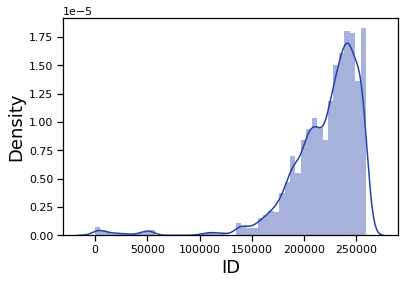

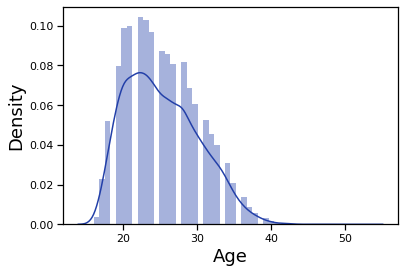

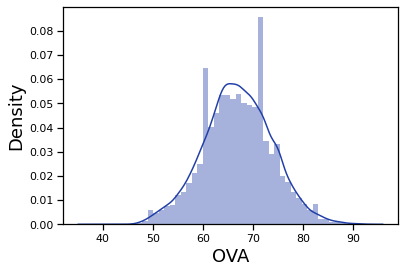

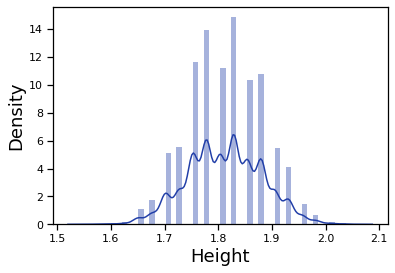

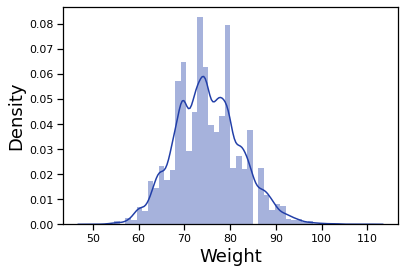

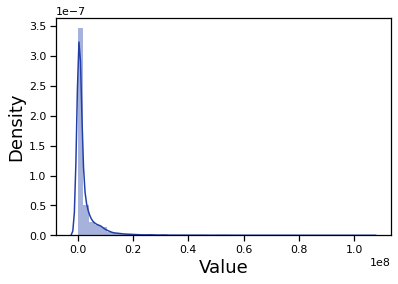

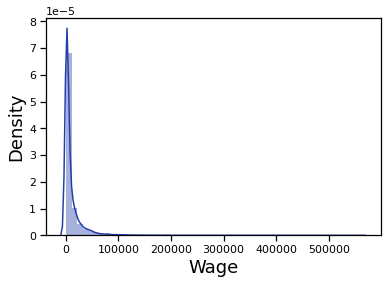

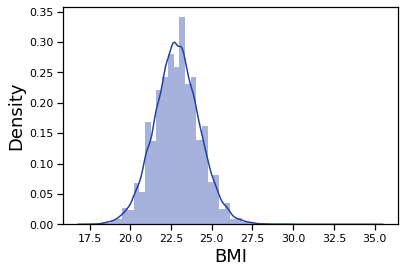

In [21]:
for column in fifa1.select_dtypes(np.number).columns:
    sns.distplot(fifa1[column])
    plt.show()

In [41]:
my_palette = sns.choose_cubehelix_palette()

interactive(children=(IntSlider(value=9, description='n_colors', max=16, min=2), FloatSlider(value=0.0, descri…

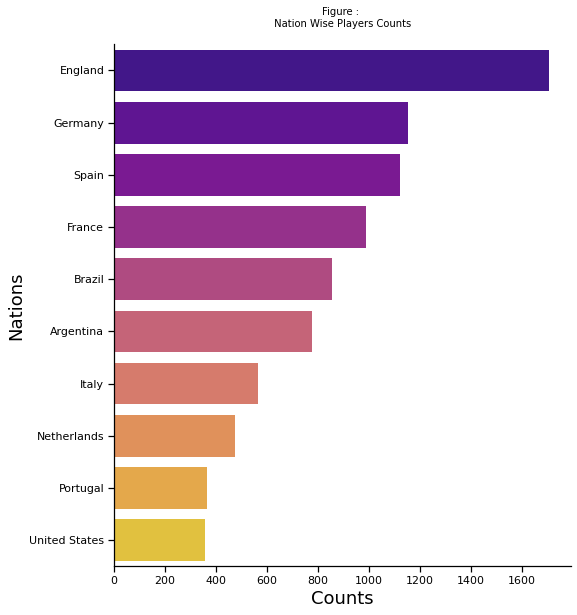

In [343]:
counts_Nationality = fifa1["Nationality"].value_counts()
counts_Nationality = counts_Nationality.reset_index()
counts_Nationality.columns= ["Nations","Counts"]

sns.catplot(y="Nations",
            x="Counts",data=counts_Nationality.head(10),
            palette='plasma', height=8,kind="bar")
plt.title("Figure : \n Nation Wise Players Counts \n",
          fontsize=10);
plt.savefig('top20nations.png', dpi=300)

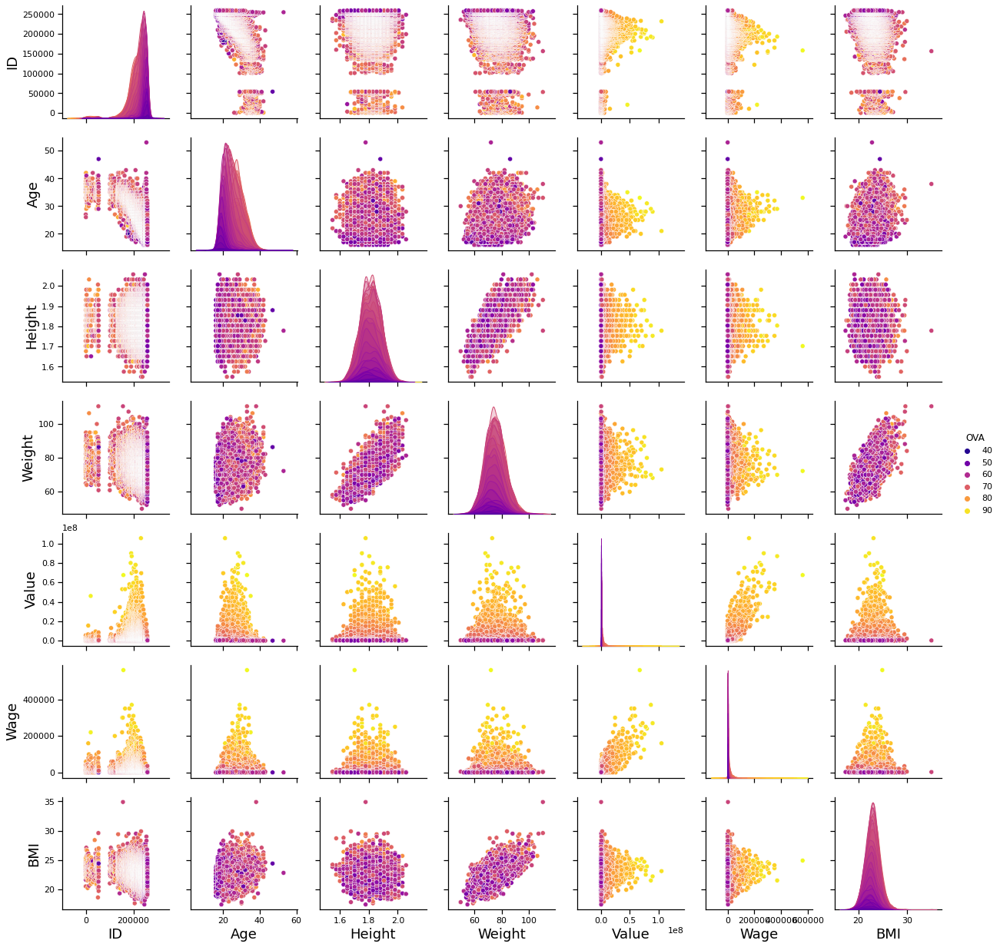

In [136]:
sns.pairplot(fifa1, hue = 'OVA', palette = 'plasma')
#plt.savefig('thepairplot.png', dpi=300)

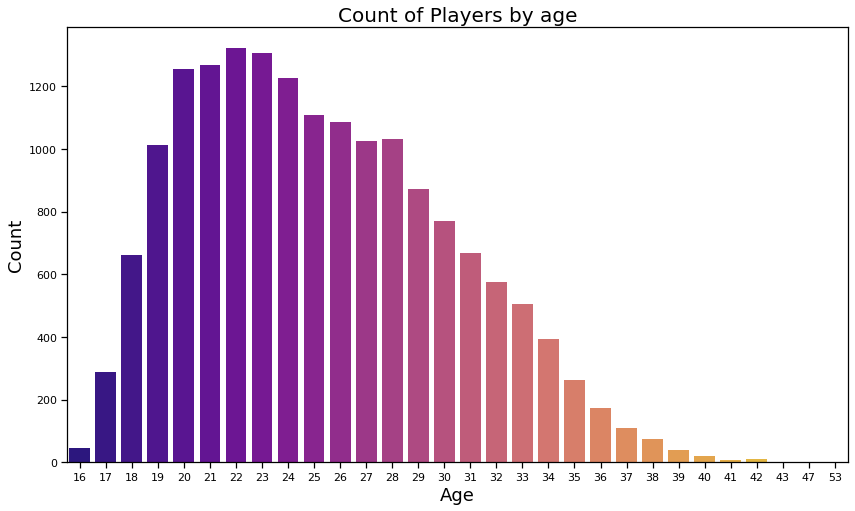

<Figure size 72x72 with 0 Axes>

In [315]:
plt.figure(figsize= (14,8))

ax = sns.countplot(x='Age', data=fifa1, palette = 'plasma')
ax.set_title(label='Count of Players by age', fontsize=20)

ax.set_xlabel(xlabel='Age')
ax.set_ylabel(ylabel='Count')

plt.show()
plt.savefig('playersbyage.png', dpi=300)

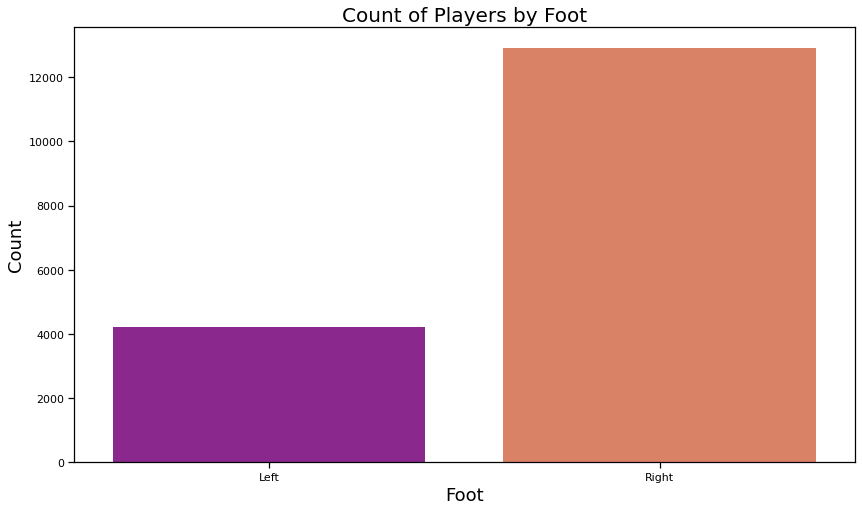

<Figure size 72x72 with 0 Axes>

In [294]:
plt.figure(figsize= (14,8))

ax = sns.countplot(x='foot', data=fifa1, palette = 'plasma')
ax.set_title(label='Count of Players by Foot', fontsize=20)

ax.set_xlabel(xlabel='Foot')
ax.set_ylabel(ylabel='Count')

plt.show()
#plt.savefig('playersbyage.png', dpi=300)

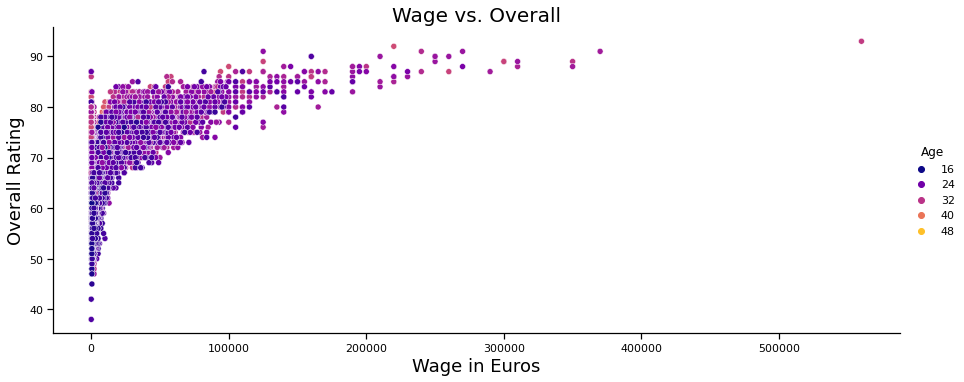

<Figure size 72x72 with 0 Axes>

In [133]:
sns.relplot(x='Wage',y='OVA',hue='Age',palette = 'plasma', aspect=2.5,data=fifa1)
plt.title('Wage vs. Overall',fontsize = 20)
plt.xlabel('Wage in Euros')
plt.ylabel('Overall Rating')
plt.show()

#plt.savefig('wagevsoverall.png', dpi=300)

In [112]:
#Top 10 Valued players
top_rated = fifa1.sort_values(by=["OVA"], ascending=False)
top_rated.head(10)

,ID,Name,Age,OVA,Nationality,Height,Weight,foot,Value,Wage,BMI
752,158023,L. Messi,33,93,Argentina,1.7018,72.141561,Left,67500000.0,560000.0,24.9
142,20801,Cristiano Ronaldo,35,92,Portugal,1.8796,83.030853,Right,46000000.0,220000.0,23.5
2871,192985,K. De Bruyne,29,91,Belgium,1.8034,69.872958,Right,87000000.0,370000.0,21.5
2287,188545,R. Lewandowski,31,91,Poland,1.8288,79.854809,Right,80000000.0,240000.0,23.9
2650,190871,Neymar Jr,28,91,Brazil,1.7526,68.058076,Right,90000000.0,270000.0,22.2
3665,200389,J. Oblak,27,91,Slovenia,1.8796,87.114338,Right,75000000.0,125000.0,24.7
2790,192448,M. ter Stegen,28,90,Germany,1.8796,84.845735,Right,69500000.0,260000.0,24.0
9331,231747,K. Mbappé,21,90,France,1.7780,73.049002,Right,105500000.0,160000.0,23.1
5777,212831,Alisson,27,90,Brazil,1.9050,91.197822,Right,62500000.0,160000.0,25.1
4166,203376,V. van Dijk,28,90,Netherlands,1.9304,92.105263,Right,75500000.0,210000.0,24.7


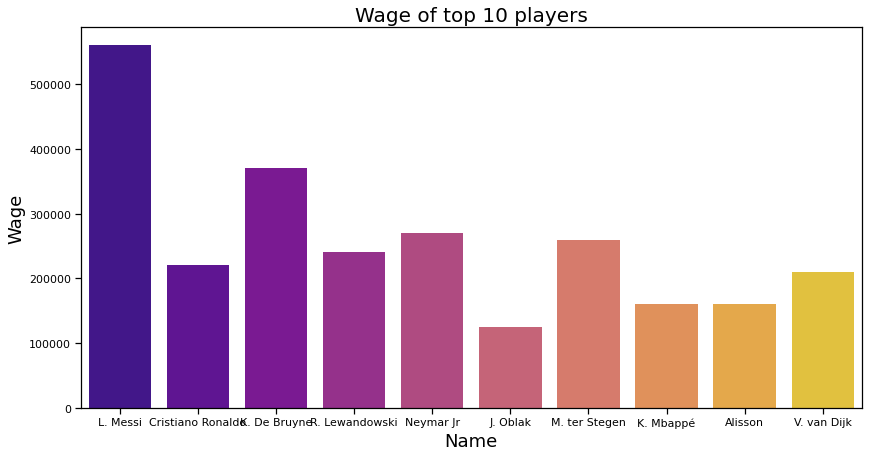

In [135]:
plt.figure(figsize=(14, 7))
sns.barplot(top_rated['Name'].head(10), top_rated['Wage'].head(10), palette="plasma").set_title("Wage of top 10 players")
#plt.savefig('wagetop10.png', dpi=300)

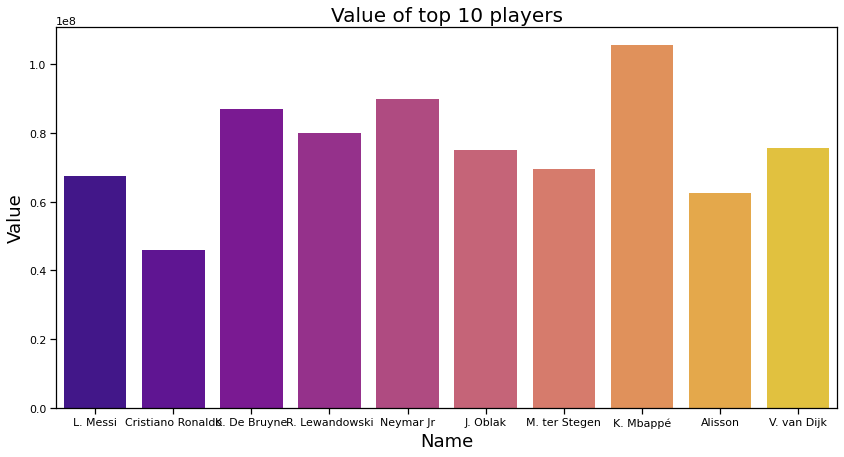

In [164]:
plt.figure(figsize=(14, 7))

sns.barplot(top_rated['Name'].head(10), top_rated['Value'].head(10), palette="plasma").set_title("Value of top 10 players")
#plt.savefig('valuetop10.png', dpi=300)

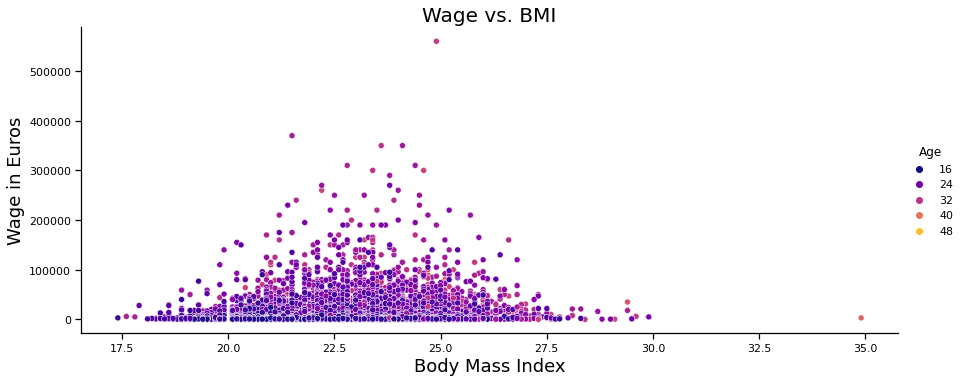

In [208]:
sns.relplot(x='BMI',y='Wage',hue='Age',palette = 'plasma', aspect=2.5,data=fifa1)
plt.title('Wage vs. BMI',fontsize = 20)
plt.xlabel('Body Mass Index')
plt.ylabel('Wage in Euros')
plt.show()
#plt.savefig('wageBMI.png', dpi=300)

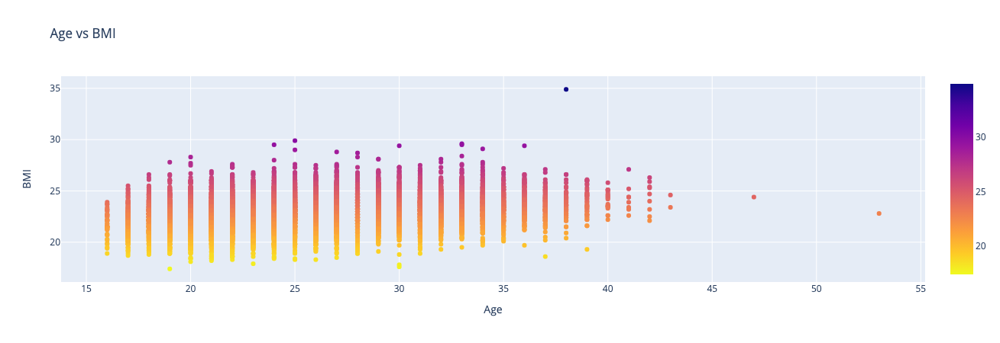

In [342]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = fifa1['Age'],
    y = fifa1['BMI'],
    mode='markers',
    marker=dict(
        color=fifa1['BMI'],
        colorscale='plasma',
        reversescale=True,
        showscale=True    ),
    text= fifa1['Name'],
))

fig.update_layout(title='Age vs BMI',
                  xaxis_title='Age',
                  yaxis_title='BMI')
fig.show()

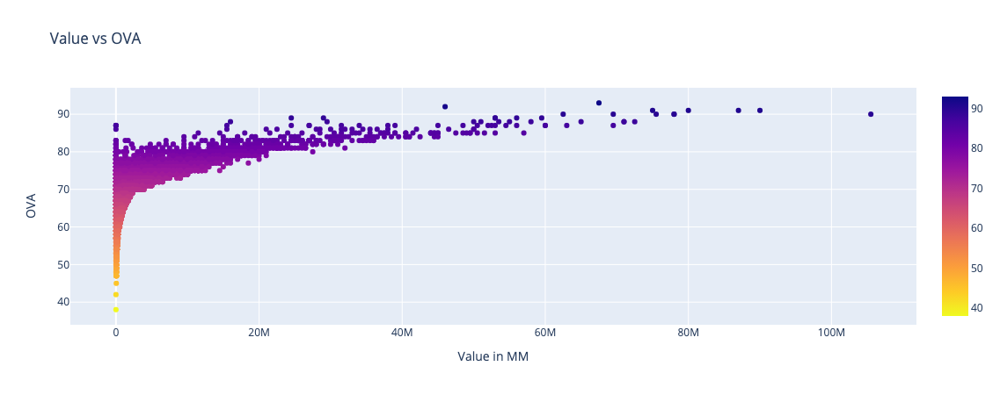

In [204]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = fifa1['Value'],
    y = fifa1['OVA'],
    mode='markers',
    marker=dict(
        color=fifa1['OVA'],
        colorscale='plasma',
        reversescale=True,
        showscale=True    ),
    text= fifa1['Name'],
))

fig.update_layout(title='Value vs OVA',
                  xaxis_title='Value in MM',
                  yaxis_title='OVA')
fig.show()

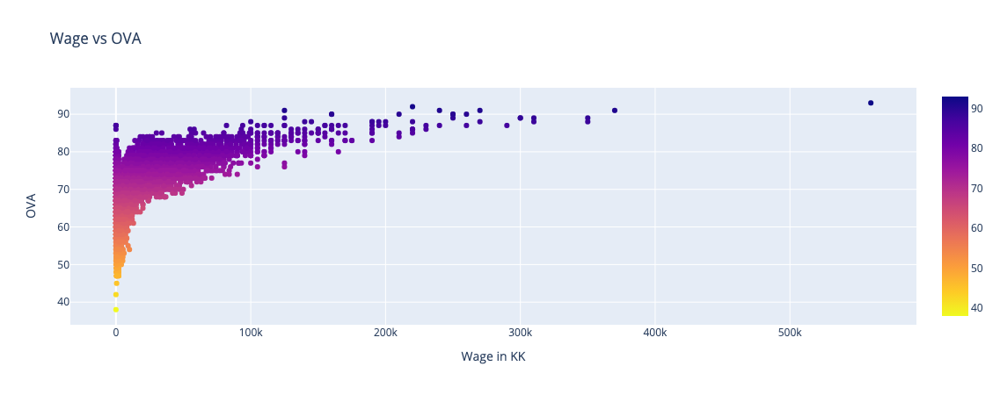

In [205]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = fifa1['Wage'],
    y = fifa1['OVA'],
    mode='markers',
    marker=dict(
        color=fifa1['OVA'],
        colorscale='plasma',
        reversescale=True,
        showscale=True    ),
    text= fifa1['Name'],
))

fig.update_layout(title='Wage vs OVA',
                  xaxis_title='Wage in KK',
                  yaxis_title='OVA')
fig.show()

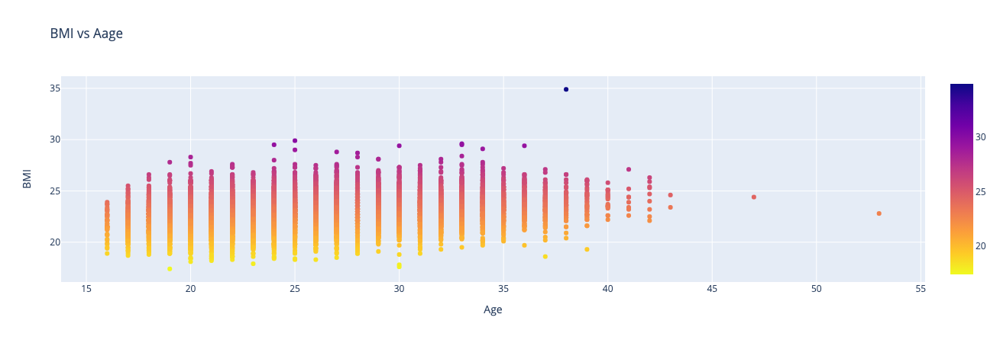

In [326]:
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = fifa1['Age'],
    y = fifa1['BMI'],
    mode='markers',
    marker=dict(
        color=fifa1['BMI'],
        colorscale='plasma',
        reversescale=True,
        showscale=True    ),
    text= fifa1['Name'],
))

fig.update_layout(title='BMI vs Aage',
                  xaxis_title='Age',
                  yaxis_title='BMI')
fig.show()

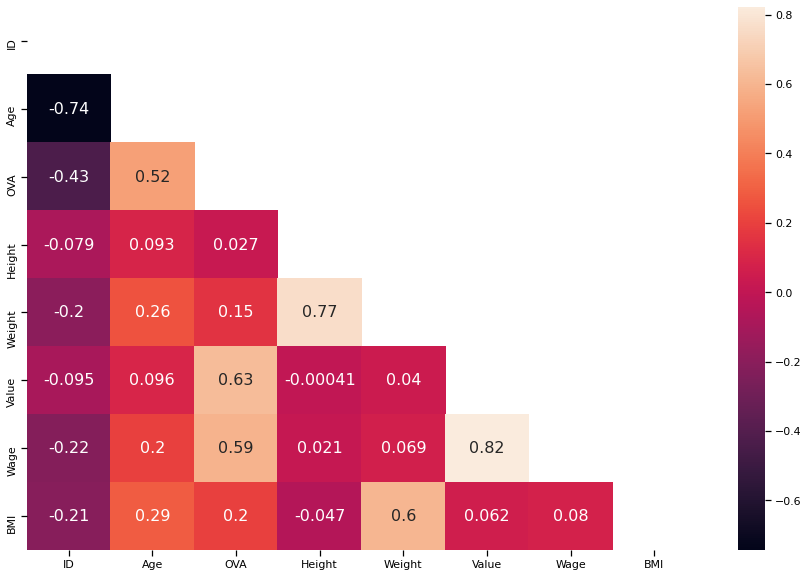

In [311]:
plt.figure(figsize=(15,10))
mask[np.triu_indices_from(mask)] = True 
sns.heatmap(fifa1.corr(), mask=mask, annot=True, cbar=True)
plt.savefig('heatmap.png', dpi=300)

In [334]:
del fifa1['Value']

KeyError: 'Value'

In [335]:

                   
X = fifa1.select_dtypes(include=['float64','int64']).drop(['Wage'], axis=1)
X = pd.DataFrame(X).fillna(X.mean())
#X = X.drop(['release_clause'], axis=1)
#X = X.values.reshape(-1, len(X))
len(X)

17125

In [336]:
y = fifa1['Wage'].values # what we want to predict
len(y)

17125

In [337]:
#splitting
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)


predictions = model.predict(X_test)

In [338]:
lm = LinearRegression() # start the model object
model = lm.fit(X,y)

In [339]:
len(X_test)

5138

In [340]:
predictions = lm.predict(X)

rmse = mean_squared_error(y, predictions, squared=False) 
print("R2_score:", round(lm.score(X,y),2)) # or r2_score(Y, predictions)
print("RMSE:", rmse)

R2_score: 0.37
RMSE: 16767.4600435274


<Figure size 1080x360 with 0 Axes>

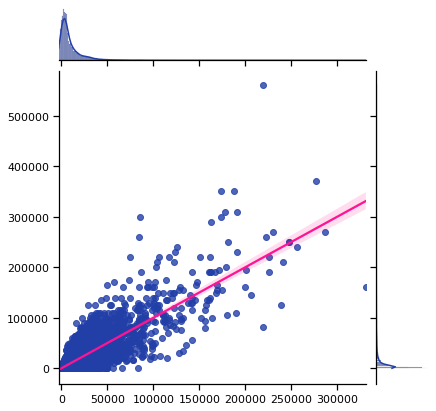

In [313]:
plt.figure(figsize=(15,5))
sns.jointplot(predictions, y, line_kws={"color": "deeppink"}, kind='reg')
plt.savefig('LR.png', dpi=300)

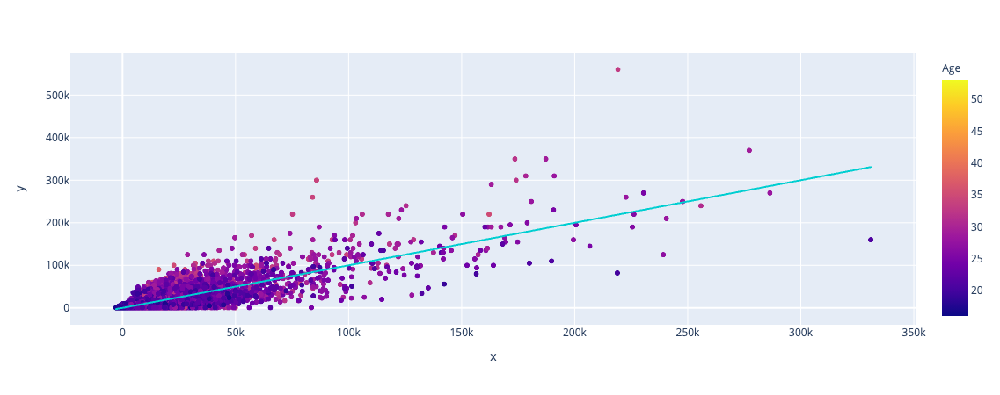

In [310]:
fig = px.scatter(fifa1, x=predictions, y=y, trendline="ols", color="Age", trendline_color_override='darkturquoise')
fig.show()